## $\color{red}{\text{Data source}}$


Climate Change: Earth Surface Temperature Data

(https://www.kaggle.com/berkeleyearth/climate-change-earth-surface-temperature-data)


## $\color{red}{\text{Import required libraries}}$




In [1]:
## Data reading
from zipfile import ZipFile
import os,shutil, glob
import re

## Data analysis
import numpy as np
import pandas as pd
import pandas_profiling
import missingno as msno

## Visualization
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objs as go
import chart_studio.plotly  as py



 ## $\color{red}{\text{Reading data from zip files}}$


In [2]:
directory="myfolder"

try:
  os.system("rm -rf %s " %directory)
except:
  pass
os.mkdir(directory)


## moving  data into myfolder 
for x in os.listdir('.'):
  if re.match('.*\.zip', x):
    with ZipFile(x, 'r') as zip:
      zip.extractall()
      y=x.split('.')[0]+'.csv'   
      shutil.copy(y, '/content/myfolder')
  elif re.match('.*\.csv', x):
    shutil.copy(x, '/content/myfolder') 
  

In [2]:
os.chdir('/content/myfolder')
df_Country= pd.read_csv("GlobalLandTemperaturesByCountry.csv",parse_dates=['dt'])
df_City=pd.read_csv("GlobalLandTemperaturesByMajorCity.csv",parse_dates=['dt'])
df_State =pd.read_csv("GlobalLandTemperaturesByState.csv",parse_dates=['dt'])
df_Global=pd.read_csv("GlobalTemperatures.csv",parse_dates=['dt'])
    

 ## $\color{red}{\text{Data profiling}}$


In [4]:
pandas_profiling.ProfileReport(df_Country)

Summarize dataset:   0%|          | 0/16 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
pandas_profiling.ProfileReport(df_State)

Summarize dataset:   0%|          | 0/17 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
pandas_profiling.ProfileReport(df_City)

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
pandas_profiling.ProfileReport(df_Global)

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Quick conclusions from data profiling

*   No duplicate entries
*   There are large number of missing values


 ##  $\color{red}{\text{A closer look at the missing values }}$




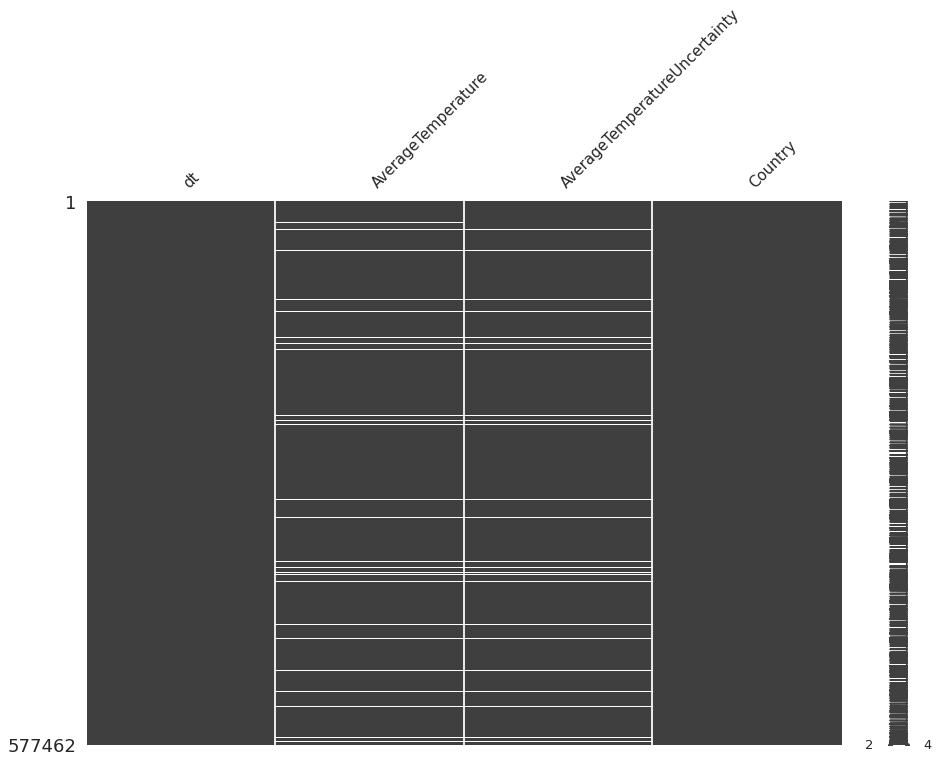

In [8]:
msno.matrix(df_Country, figsize=(15,10), fontsize=15, sparkline=True)

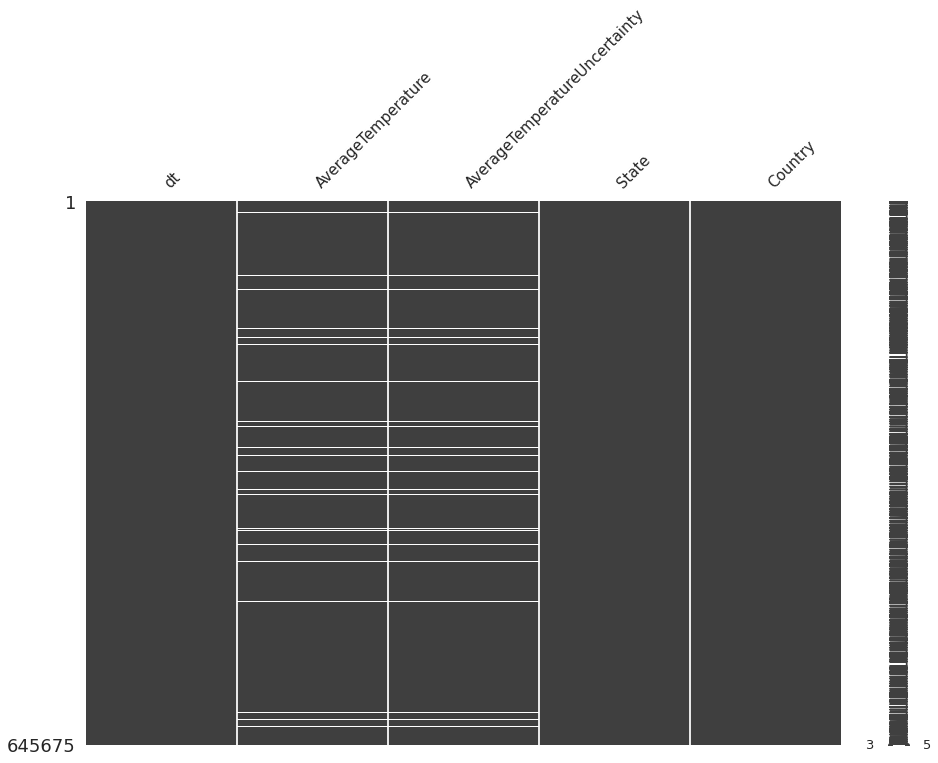

In [9]:
msno.matrix(df_State, figsize=(15,10), fontsize=15, sparkline=True)


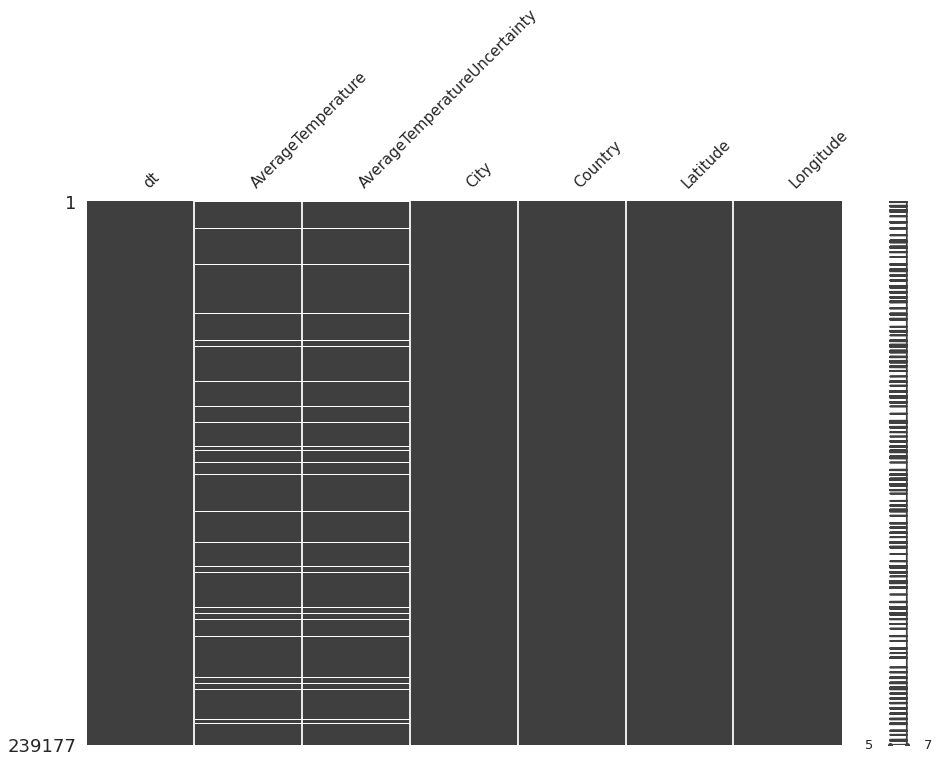

In [10]:
msno.matrix(df_City, figsize=(15,10), fontsize=15, sparkline=True)


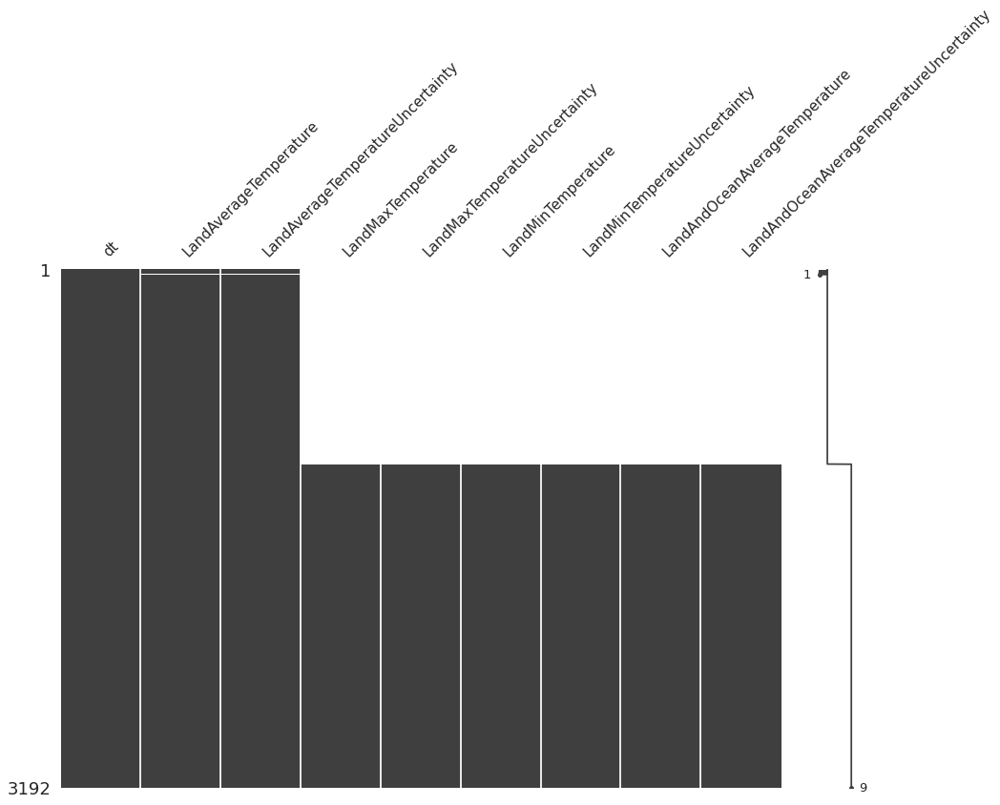

In [11]:
msno.matrix(df_Global, figsize=(15,10), fontsize=15, sparkline=True)


## $\hspace{10cm}\color{red}{\text{Global Temperature analysis}}$

* We remove the null values here. One could try imputing the missing
values also. For simplicity we stick to the former approach.

* Here we create a new data frame, with date, average tempearture and LandAverageTemperatureUncertainty. So that without losing much data we can study how the global temperature behaves over the years starting from seventeenth centuary.


In [4]:
columnames=df_Global.columns.to_list()[3:]

In [5]:
df_Global["Year"]=pd.DatetimeIndex(df_Global['dt']).year
df_Global["Month"]=pd.DatetimeIndex(df_Global['dt']).month

In [6]:
df_Globalsub1=df_Global.drop(columnames,axis=1)


In [7]:
df_Globalsub1.head()

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,Year,Month
0,1750-01-01,3.034,3.574,1750,1
1,1750-02-01,3.083,3.702,1750,2
2,1750-03-01,5.626,3.076,1750,3
3,1750-04-01,8.490,2.451,1750,4
4,1750-05-01,11.573,2.072,1750,5


In [8]:
df_Global.dropna(inplace=True)

In [9]:
df_Globalsub1.dropna(inplace=True)

In [10]:
df_Globalsub1.to_csv("global.csv")

In [11]:
df_Globalsub1.head()

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,Year,Month
0,1750-01-01,3.034,3.574,1750,1
1,1750-02-01,3.083,3.702,1750,2
2,1750-03-01,5.626,3.076,1750,3
3,1750-04-01,8.490,2.451,1750,4
4,1750-05-01,11.573,2.072,1750,5


In [12]:
conditions = [
    (df_Globalsub1['Year'] >= 1701) & (df_Globalsub1['Year'] <= 1800 ),
    (df_Globalsub1['Year'] >= 1801) & (df_Globalsub1['Year'] <=1900 ),
    (df_Globalsub1['Year'] >= 1901) & (df_Globalsub1['Year'] <= 2000),
    (df_Globalsub1['Year'] >= 2001) & (df_Globalsub1['Year'] <= 2100),
    ]
values = ['eighteenth','nineteenth','twentieth', 'twentyfirst']

df_Globalsub1['Centuary'] = np.select(conditions, values)

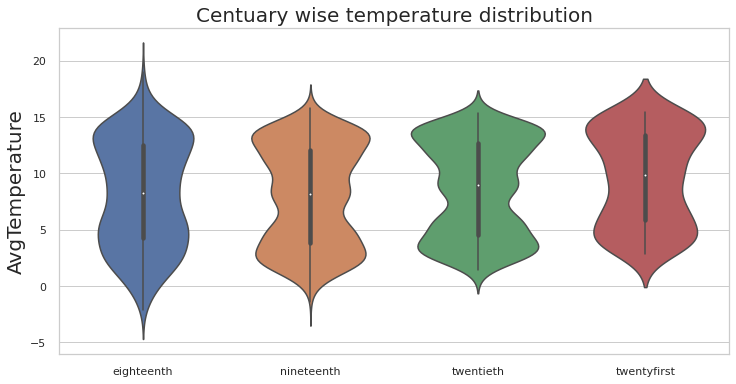

In [13]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,6))
sns.set(font_scale = 10)
sns.set_theme(style="whitegrid")
sns.violinplot(x="Centuary", y="LandAverageTemperature", data=df_Globalsub1)
plt.xlabel(None, size=20)
plt.ylabel("AvgTemperature", size=20)
plt.title("Centuary wise temperature distribution",size=20)
plt.show()

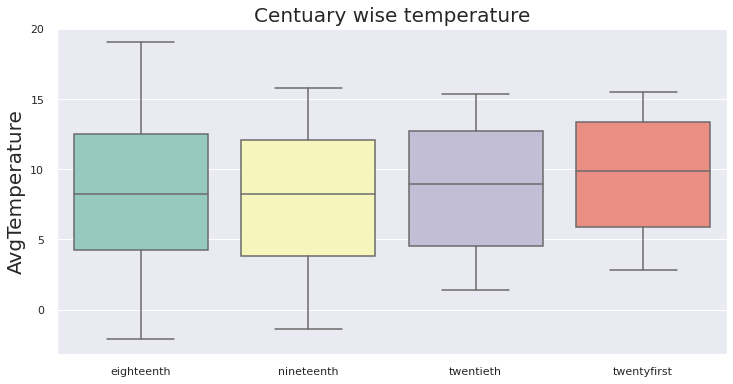

In [14]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,6))
sns.boxplot(x="Centuary",
            y="LandAverageTemperature",
            data=df_Globalsub1,
            palette="Set3")
plt.xlabel(None, size=20)
plt.ylabel("AvgTemperature", size=20)
plt.title("Centuary wise temperature",size=20)
plt.show()


In [15]:
df_Globalsub2=df_Globalsub1.groupby("Year",as_index=False)["LandAverageTemperature","LandAverageTemperatureUncertainty"].mean()
df_Globalsub2['upperbound']=df_Globalsub2['LandAverageTemperature']+ df_Globalsub2['LandAverageTemperatureUncertainty']
df_Globalsub2['lowerbound']=df_Globalsub2['LandAverageTemperature']- df_Globalsub2['LandAverageTemperatureUncertainty']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [16]:
df_Globalsub4=df_Globalsub1.groupby("Year",as_index=False)["LandAverageTemperature","LandAverageTemperatureUncertainty"].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [18]:
df_Globalsub3=df_Globalsub2.drop("LandAverageTemperatureUncertainty",axis=1)

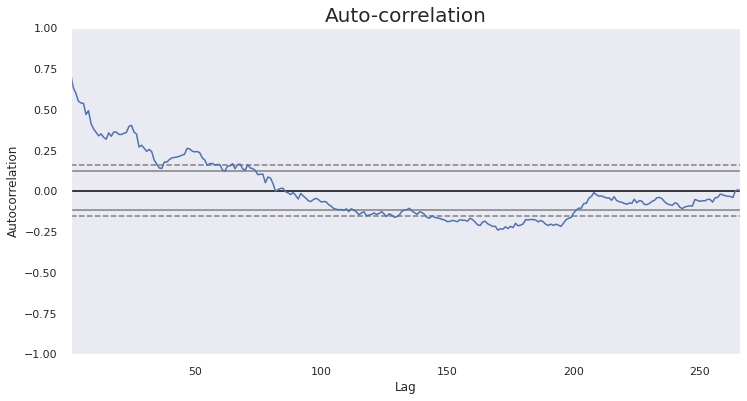

In [19]:
s1=df_Globalsub3["LandAverageTemperature"]
plt.figure(figsize=(12,6))

x = pd.plotting.autocorrelation_plot(s1)
 
x.plot()
plt.title("Auto-correlation",size=20)
plt.show()

In [20]:
m, b = np.polyfit(df_Globalsub2['Year'], df_Globalsub2['LandAverageTemperature'], 1)
fit=m*df_Globalsub2['Year'].values + b

In [21]:
df_Globalsub2

,Year,LandAverageTemperature,LandAverageTemperatureUncertainty,upperbound,lowerbound
0,1750,8.719364,2.637818,11.357182,6.081545
1,1751,7.976143,2.781143,10.757286,5.195000
2,1752,5.779833,2.977000,8.756833,2.802833
3,1753,8.388083,3.176000,11.564083,5.212083
4,1754,8.469333,3.494250,11.963583,4.975083
...,...,...,...,...,...
261,2011,9.516000,0.082000,9.598000,9.434000
262,2012,9.507333,0.083417,9.590750,9.423917
263,2013,9.606500,0.097667,9.704167,9.508833
264,2014,9.570667,0.090167,9.660833,9.480500


In [22]:
fig = go.Figure([
    go.Scatter(
        name='avg',
        x=df_Globalsub2['Year'].values,
        y=df_Globalsub2['LandAverageTemperature'].values,
        mode='lines',
        line=dict(color='rgb(31, 119, 180)'),
    ),
    go.Scatter(
        name='linear fit',
        x=df_Globalsub2['Year'].values,
        y=fit,
        mode='lines',
        line=dict(color='firebrick', width=3,dash='dash'),
    ),
        go.Scatter(
        name='Upper Bound',
        x=df_Globalsub2['Year'].values,
        y=df_Globalsub2['upperbound'].values,
        mode='lines',
        marker=dict(color="#444"),
        line=dict(width=0),
        showlegend=False
    ),
    go.Scatter(
        name='Lower Bound',
        x=df_Globalsub2['Year'].values,
        y=df_Globalsub2['lowerbound'].values,
        marker=dict(color="#444"),
        line=dict(width=0),
        mode='lines',
        fillcolor='rgba(68, 68, 68, 0.3)',
        fill='tonexty',
        showlegend=False
    ),
])
fig.update_layout(
    yaxis_title='avg temp(\N{DEGREE SIGN}C)',
    title={
        'text': "Average global temperature over the years",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
   hovermode="x"
)
fig.show()

In [23]:
df_Global1=df_Global.groupby('Year',as_index=False)["LandAverageTemperature","LandAverageTemperatureUncertainty","LandMaxTemperature","LandMaxTemperatureUncertainty","LandMinTemperature","LandMinTemperatureUncertainty"].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [24]:
import plotly.graph_objects as go
list1=df_Global1["Year"].values
list2=df_Global1["LandMaxTemperature"].values
list3=df_Global1["LandMinTemperature"].values
list4=df_Global1["LandMaxTemperatureUncertainty"].values
list5=df_Global1["LandMinTemperatureUncertainty"].values
list6=df_Global1["LandAverageTemperature"].values
list7=df_Global1["LandAverageTemperatureUncertainty"].values




fig = go.Figure(data=[
    go.Bar(name='MAX', x=list1[0::15], y=list2[0::15],error_y_array=list4[0::15],marker=dict(
                     colorscale='earth')),
    go.Bar(name='MIN', x=list1[0::15], y=list3[0::15],error_y_array=list5[0::15],marker=dict( 
                     colorscale='dense')),
    go.Bar(name='average', x=list1[0::15], y=list6[0::15],error_y_array=list7[0::15],marker=dict(
                     colorscale='sunset', reversescale = True))
                      
])
# Change the bar mode
fig.update_layout(barmode='group',showlegend= True,
                      title={
        'text': "MAX,MIN,average of global temperature",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()

## $\hspace{10cm} \color{red}{\text{ Country wise Analysis}}$


In [3]:
df_Country.dropna(inplace=True)

In [4]:
df_Country.reset_index(drop=True)


,dt,AverageTemperature,AverageTemperatureUncertainty,Country
0,1743-11-01,4.384,2.294,Åland
1,1744-04-01,1.530,4.680,Åland
2,1744-05-01,6.702,1.789,Åland
3,1744-06-01,11.609,1.577,Åland
4,1744-07-01,15.342,1.410,Åland
...,...,...,...,...
544806,2013-04-01,21.142,0.495,Zimbabwe
544807,2013-05-01,19.059,1.022,Zimbabwe
544808,2013-06-01,17.613,0.473,Zimbabwe
544809,2013-07-01,17.000,0.453,Zimbabwe


In [5]:
country_code=pd.read_csv("/content/countrycode.csv")

In [6]:
country_code

,Country,AverageTemperature,Codes
0,Afghanistan,14.045007,AFG
1,Africa,24.074203,NaN
2,Albania,12.610646,ALB
3,Algeria,22.985112,DZA
4,American Samoa,26.611965,ASM
...,...,...,...
238,Western Sahara,22.319818,ESH
239,Yemen,26.253597,YEM
240,Zambia,21.282956,ZMB
241,Zimbabwe,21.117547,ZWE


In [7]:
code2=country_code['Codes'].values.tolist()
list1=df_Country['Country'].values.tolist()
list2=country_code['Country'].values.tolist()
code1=[]
for item in list1:
    if item in list2:
      code1.append(code2[list2.index(item)])
    else:
       code1.append('NA')

In [16]:
df_Country['Codes']=code1

In [9]:
df_Country['Year']=pd.DatetimeIndex(df_Country['dt']).year

In [10]:
df_Country.to_csv("df_country.csv",index=None)

In [11]:
df_Country1=df_Country.groupby(['Year','Country', 'Codes'],  as_index=False)["AverageTemperature"].mean()

In [12]:
df_Country1

,Year,Country,Codes,AverageTemperature
0,1743,Albania,ALB,8.62000
1,1743,Andorra,AND,7.55600
2,1743,Austria,AUT,2.48200
3,1743,Belarus,BLR,0.76700
4,1743,Belgium,BEL,7.10600
...,...,...,...,...
43791,2013,Western Sahara,ESH,23.74425
43792,2013,Yemen,YEM,28.12975
43793,2013,Zambia,ZMB,21.19600
43794,2013,Zimbabwe,ZWE,20.71075


In [13]:
year=1850

data = [ dict(
        type = 'choropleth',
        locations =df_Country1[df_Country1['Year']==year].Codes.values,
        z = df_Country1[df_Country1['Year']==year].AverageTemperature.values,
        text = df_Country1[df_Country1['Year']==year].Country.values,
        colorscale = 'rdylbu',
        autocolorscale = False,
        reversescale = True,
        marker = dict(
            line = dict (
                color = 'rgb(180,180,180)',
                width = 0.5
            ) ),
        colorbar = dict(
            ticksuffix= '\N{DEGREE SIGN}C',
            title = 'Temperature ',
            ),
      ) ]

layout = dict(
    geo = dict(
        landcolor = 'lightgray',
        showland = True,
        showcountries = True,
        countrycolor = '#444444',
        countrywidth = 0.5,
        resolution= 50,
        projection = dict(
            type = 'natural earth'
        )
    )
)

fig = go.FigureWidget( data=data, layout=layout )
fig.layout.title = 'Country-wise average temperature for a specific year'
fig.show()

In [14]:
options =["Africa", "Europe", "South America", "North America", "Oceania", "Asia"]

df_Country2 =df_Country.loc[df_Country['Country'].isin(options)]

In [23]:
df_Country2.drop("Codes",axis=1,inplace=True)

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [24]:
df_Country2['Country'].unique()

array(['Africa', 'Asia', 'Europe', 'North America', 'Oceania',
       'South America'], dtype=object)

In [57]:
df_Country2['Year']=pd.DatetimeIndex(df_Country2['dt']).year

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [25]:
df_Country2.isnull().values.any()

False

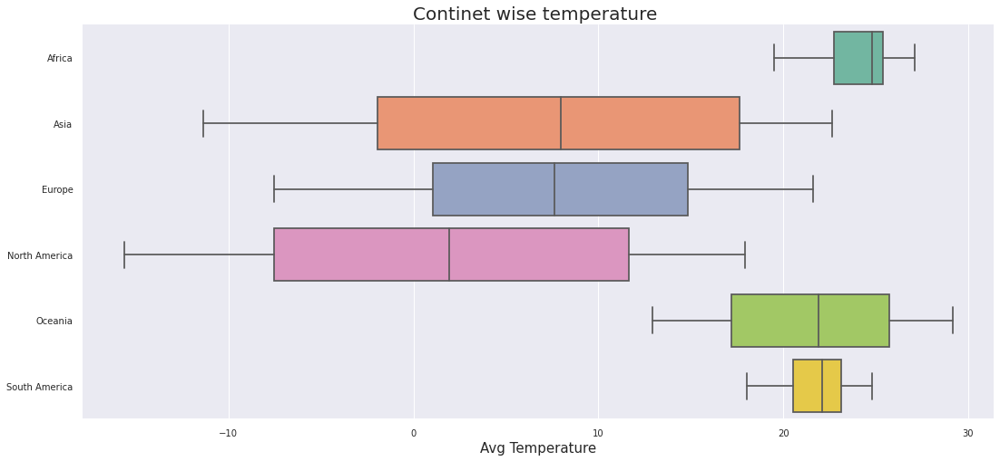

In [28]:
sns.set_style('darkgrid')
plt.figure(figsize=(18,8))
sns.boxplot(
            y="Country",
            x="AverageTemperature" ,
            data=df_Country2,
            palette="Set2")
plt.xlabel(None, size=20)
plt.xlabel("Avg Temperature", size=15)
plt.title("Continet wise temperature ",size=20)
plt.ylabel(None)
plt.show()

In [29]:
df_Country2=df_Country2.groupby(['Year','Country'],as_index=False)['AverageTemperature','AverageTemperatureUncertainty'].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [30]:
fig = go.Figure([
    go.Scatter(
        name='Europe',
       x=df_Country2[df_Country2['Country']=='Europe'].Year.values,
        y=df_Country2[df_Country2['Country']=='Europe'].AverageTemperature.values,
        mode='lines',
        line=dict(color='rgb(44, 160, 44)'),
    ),
    go.Scatter(
        name='Africa',
        x=df_Country2[df_Country2['Country']=='Africa'].Year.values,
        y=df_Country2[df_Country2['Country']=='Africa'].AverageTemperature.values,
        mode='lines',
        line=dict(color='darkorchid',width=2),
    ), 

    go.Scatter(
        name='South America',
        x=df_Country2[df_Country2['Country']=='South America'].Year.values,
        y=df_Country2[df_Country2['Country']=='South America'].AverageTemperature.values,
        mode='lines',
        line=dict(color='lawngreen'),
    ), 

    go.Scatter(
        name='North America',
        x=df_Country2[df_Country2['Country']=='North America'].Year.values,
        y=df_Country2[df_Country2['Country']=='North America'].AverageTemperature.values,
        mode='lines',
        line=dict(color='rgb(188, 189, 34)'),
    ),
    go.Scatter(
        name='Oceania',
        x=df_Country2[df_Country2['Country']=='Oceania'].Year.values,
        y=df_Country2[df_Country2['Country']=='Oceania'].AverageTemperature.values,
        mode='lines',
        line=dict(color='aqua', width=2),
    ),
    go.Scatter(
        name='Asia',
        x=df_Country2[df_Country2['Country']=='Asia'].Year.values,
        y=df_Country2[df_Country2['Country']=='Asia'].AverageTemperature.values,
        mode='lines',
        line=dict(color='orange',width=2),
    ),
])
fig.update_layout(
    yaxis_title='avg temp(\N{DEGREE SIGN}C)',
    title={
        'text': "Continent-wise temperature over the years",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
   hovermode="x"
)
fig.update_layout(xaxis_range=[1850,2015])
fig.update_layout(yaxis_range=[-5,30])
fig.show()

In [37]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()

list1=df_Country2["Year"].unique().tolist()
#list1=list1[100::10]
list=df_Country2["Year"].unique()
list1=df_Country2["Country"].unique()
# Add traces, one for each slider step


list=df_Country2["Year"].unique()
for year in list:

    list1=sorted(df_Country2["Country"].unique())
    list2= df_Country2[df_Country2["Year"]==year].AverageTemperature.values
    list3= df_Country2[df_Country2["Year"]==year].AverageTemperatureUncertainty.values
    fig.add_trace(
       go.Bar(visible=False,x=list1, y=list2, error_y_array=list3,marker=dict(color = list2,colorbar = dict(
            ticksuffix= '\N{DEGREE SIGN}C',
            title = 'Temperature ',
            ),
                     colorscale='sunset')))

fig.data[0].visible = True

# Create and add slider
steps = []

for i in range(len(fig.data)):
    YEAR=list[i]
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": f"Slider switched to step:{YEAR}" }],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()#


## $\hspace{10cm} \color{red}{\text{ State wise Analysis}}$





In [38]:
df_State['Year']=pd.DatetimeIndex(df_State['dt']).year

In [39]:
df_State

,dt,AverageTemperature,AverageTemperatureUncertainty,State,Country,Year
0,1855-05-01,25.544,1.171,Acre,Brazil,1855
1,1855-06-01,24.228,1.103,Acre,Brazil,1855
2,1855-07-01,24.371,1.044,Acre,Brazil,1855
3,1855-08-01,25.427,1.073,Acre,Brazil,1855
4,1855-09-01,25.675,1.014,Acre,Brazil,1855
...,...,...,...,...,...,...
645670,2013-05-01,21.634,0.578,Zhejiang,China,2013
645671,2013-06-01,24.679,0.596,Zhejiang,China,2013
645672,2013-07-01,29.272,1.340,Zhejiang,China,2013
645673,2013-08-01,29.202,0.869,Zhejiang,China,2013


In [40]:
df_State1=df_State.groupby(['Year',"Country", "State"],as_index=False)["AverageTemperature","AverageTemperatureUncertainty"].mean()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [41]:
df_State1

,Year,Country,State,AverageTemperature,AverageTemperatureUncertainty
0,1743,Canada,New Brunswick,-1.723000,2.183000
1,1743,Canada,Newfoundland And Labrador,-6.497000,3.126000
2,1743,Canada,Nova Scotia,1.909000,2.033000
3,1743,Canada,Ontario,-6.615000,3.350000
4,1743,Canada,Prince Edward Island,0.665000,2.208000
...,...,...,...,...,...
53970,2013,United States,Virginia,14.731556,0.332222
53971,2013,United States,Washington,10.571778,0.351556
53972,2013,United States,West Virginia,13.029444,0.334667
53973,2013,United States,Wisconsin,8.085333,0.348667


In [42]:
df_State1.drop("Year",axis=1,inplace=True)

In [43]:
pd.pivot_table(df_State1,index=['Country','State']).head(50)

AverageTemperature  AverageTemperatureUncertainty
Country   State                                                                          
Australia Australian Capital Territory           11.578638                       0.607806
          New South Wales                        17.227354                       0.541217
          Northern Territory                     24.811118                       0.648322
          Queensland                             23.012993                       0.505685
          South Australia                        19.144199                       0.657109
          Tasmania                               10.860840                       0.627924
          Victoria                               14.011595                       0.532450
          Western Australia                      22.370926                       0.517130
Brazil    Acre                                   25.843481                       0.641255
          Alagoas                                24.682370                       0.755771
          Amazonas                               26.126730                       0.596056
          Bahia                                  24.032030                       0.800086
          Distrito Federal                       21.782213                       0.815383
          Mato Grosso                            25.532492                       0.732654
          Mato Grosso Do Sul                     23.578586                       0.853673
          Minas Gerais                           21.877467                       0.815388
          Pernambuco                             25.289348                       0.769272
          Rio De Janeiro                         21.937799                       0.910584
          Rio Grande Do Norte                    27.001167                       0.695210
          Rio Grande Do Sul                      18.735874                       0.839768
          Roraima                                25.776951                       0.639965
          Santa Catarina                         18.348312                       0.850170
          Sergipe                                25.372053                       0.760663
          Tocantins                              25.799534                       0.770049
Canada    Alberta                                -0.456806                       1.715815
          British Columbia                        0.117338                       0.992404
          Manitoba                               -3.057292                       1.690340
          New Brunswick                           3.598759                       1.469038
          Newfoundland And Labrador              -1.961193                       1.882041
          Northwest Territories                  -9.923857                       2.187603
          Nova Scotia                             5.556773                       1.466026
          Nunavut                               -14.539137                       1.968370
          Ontario                                -0.131426                       1.731924
          Prince Edward Island                    4.834965                       1.498516
          Saskatchewan                           -0.818143                       1.711727
          Yukon                                  -7.283036                       1.730158
China     Anhui                                  15.293285                       0.755365
          Beijing                                 9.017674                       1.043223
          Chongqing                              15.815811                       0.805820
          Fujian                                 18.646677                       0.742635
          Gansu                                   5.307434                       1.019153
          Guangdong                              21.082616                       0.746516
          Guangxi                                20.078023                      